In [45]:
#importing all necessary packages
import numpy as np
import pandas as pd
import scanpy.api as sc
from scipy.misc import factorial
import os
import re

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
#where to store?
#results_file = '/data/bioinf/projects/data/2018_sparse2big/RData/Retina-s3-sample.h5ad'
sc.settings.set_figure_params(dpi=80)
sc.settings.figdir="/data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/"

scanpy==1.3.1 anndata==0.6.10 numpy==1.15.0 scipy==1.1.0 pandas==0.23.4 scikit-learn==0.19.1 statsmodels==0.9.0 python-igraph==0.7.1 louvain==0.6.1 


# Functions 
## Preprocessing the single cell data

In [46]:
def PreprocessSC(data_path, data_type):
    
    path = data_path
    
    # Build adata
    # var_names = HGNC symbols but adding ENSEMBLE gene IDs additionally
    # obs_names = Cell-IDs
    # -------------------------------------------------------------------- #
    global adata
    adata = sc.read(path + 'matrix.mtx', cache=True).T  # transpose the data
    genes = pd.read_csv(path + 'genes.tsv', header=None, sep='\t')
    adata.var_names = genes[1]
    adata.var['gene_ids'] = genes[0].tolist()  
    adata.obs_names = pd.read_csv(path + 'barcodes.tsv', header=None)[0]
    adata.var_names_make_unique()
    
    # -------------------------------------------------------------------- #
    # -------------------------------------------------------------------- #
    # Starting preprocessing
    # Highest expressed genes
    # -------------------------------------------------------------------- #
    sc.pl.highest_expr_genes(adata, n_top=20)
    
    # Filtering based on min. expressed genes per cell and vice versa
    sc.pp.filter_cells(adata, min_genes=200)
    sc.pp.filter_genes(adata, min_cells=3)
    
    # Prepare filtering for mitochondrial genes (based on HGNC)    
    # -------------------------------------------------------------------- #
    hgnc = [name for name in adata.var_names if name.startswith('MT-')]
    hgnc
    a = adata.var[adata.var_names.isin(hgnc)]
    mito_genes = a.index.values.tolist()
    adata.obs['percent_mito'] = np.sum(
        adata[:, mito_genes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1
    adata.obs['n_counts'] = adata.X.sum(axis=1).A1
    
    # Save violin plot 
    # -------------------------------------------------------------------- #
    sc.pl.violin(adata, ['n_genes', 'n_counts', 'percent_mito'],
                 jitter=0.4, multi_panel=True, save = 'PT_Clust_Violin_Genes_Counts_Mito_' + str(data_type) + '.svg')
    
    # Plot scatter plots
    # -------------------------------------------------------------------- #
    sc.pl.scatter(adata, x='n_counts', y='percent_mito')
    sc.pl.scatter(adata, x='n_counts', y='n_genes')
    


## Parameter tuning via genes and percent mitochondrial genes

In [47]:
def ParaTune_Clust (adata_input, cutoff_mito, cutoff_ngenes, data_type):
    # Filter sc data
    # -----------------------------------------------------------------------
    global adata
    adata = adata_input
    adata = adata[adata.obs['n_genes'] < cutoff_ngenes, :]
    adata = adata[adata.obs['percent_mito'] < cutoff_mito, :]
    # Log raw data and Normalize sc data
    # -----------------------------------------------------------------------
    adata.raw = sc.pp.log1p(adata, copy=True)
    sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
    # Filtering according to HVG
    # -----------------------------------------------------------------------
    filter_result = sc.pp.filter_genes_dispersion(
        adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
    sc.pl.filter_genes_dispersion(filter_result)
    adata = adata[:, filter_result.gene_subset]
    # Final step in data normalization, scaling and correction
    # -----------------------------------------------------------------------
    sc.pp.log1p(adata)
    sc.pp.regress_out(adata, ['n_counts', 'percent_mito'])
    sc.pp.scale(adata, max_value=10)
    
    # Downstream Analysis
    # Calculate PCA
    # -----------------------------------------------------------------------
    sc.tl.pca(adata, svd_solver='arpack')
    
    sc.pl.pca(adata)
    sc.pl.pca_variance_ratio(adata, log=False)
    # Compute Neighbours for LV- clustering
    # -----------------------------------------------------------------------
    sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)
    sc.tl.umap(adata)
    sc.tl.louvain(adata, resolution = 2.0)
    # Plot umap embedding of louvain clustering
    # -----------------------------------------------------------------------
    sc.pl.umap(adata, color=['louvain'],save = 'PT_Clust_LV_Genes' + str(cutoff_ngenes).replace(".", "_") + '_Mito' + str(cutoff_mito).replace(".", "_") + "_" + str(data_type) +".svg")
    # Plot dotplot of marker genes for cones, rods, MG and other cells from Kim publication
    # -----------------------------------------------------------------------
    #subset_MG = pd.DataFrame(marker_genes)[0][pd.DataFrame(marker_genes)[0].isin(adata.var_names)].tolist()
    #ax = sc.pl.dotplot(adata, subset_MG, groupby='louvain',save = 'PT_Clust_DP_Genes' + str(cutoff_ngenes).replace(".", "_") + '_Mito' + str(cutoff_mito).replace(".", "_") +"_" + str(data_type) +".svg")
    #adata.write('/data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/Data/' + data_type + '_pp.h5ad')

## Highlighting Louvain clusters 

## GOI sets from MK 

In [48]:
def GOI_MK_dotplot (adata_input, data_type ):
    
    adata = adata_input
    
    # Where are thh files
    # -----------------------------------------------------------------------
    files = os.listdir('/data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/input/')
    names = [re.sub("_summary_final.csv", "", x) for x in files]
    
    # Iterate over GOI sets:
    # -----------------------------------------------------------------------
    for i in names:
        x="/data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/input/"+ i +"_summary_final.csv"
        genes = pd.read_csv(x, sep = "\t")
        #marker_genes = genes['x']
        c = np.intersect1d(genes, adata.var_names)
        if len(c) != 0 :
            bx = sc.pl.dotplot(adata, c, groupby='louvain', save="_MasterGOI_" + i + "_" + str(data_type) + ".svg")  
        else :
            print("No overlap found for " + str(i))


In [49]:
other = ['#BDBDBD']
rods_col = "#09CECE"
cones_col = "#FC00FF"
bi_col = "#808285"
MuGl_col = '#0000FF'
ahg_col = '#C4C5C6'
pr_col = '#F6ACF2'

# Analysis of CTRL sample 3

## Preprocessing sample 3

In [50]:
# Control 3

... reading from cache file ./cache/data-bioinf-projects-data-2018_scanpyTutorial-input-sc_hROHT-S3_CTRL_HRO2-raw_gene_bc_matrices-hg38.e87-matrix.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
filtered out 343052 cells that have less than 1 counts


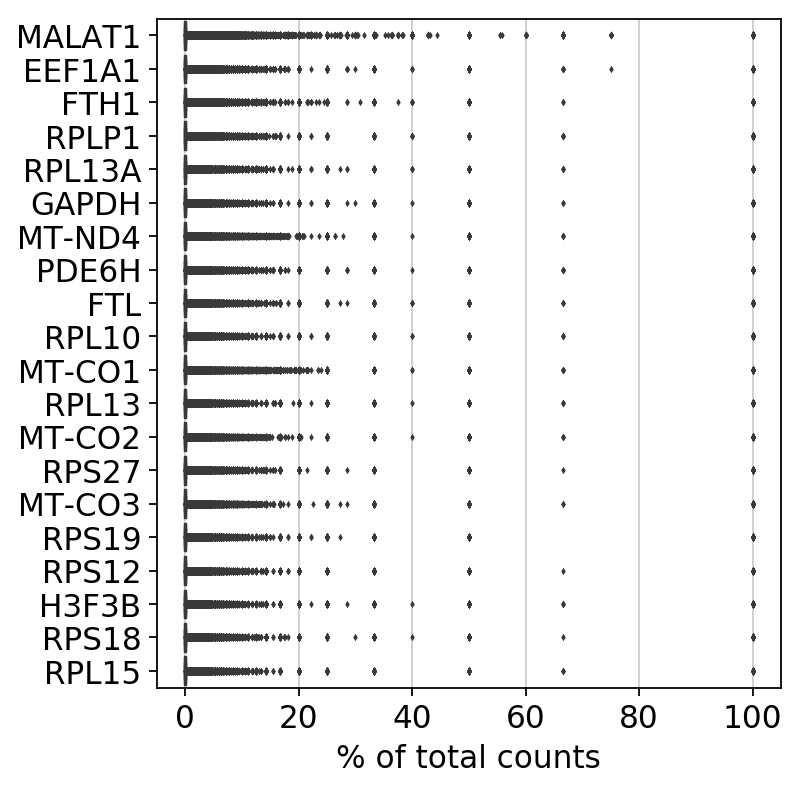

filtered out 728622 cells that have less than 200 genes expressed
filtered out 11909 genes that are detected in less than 3 cells
saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/violinPT_Clust_Violin_Genes_Counts_Mito_CTRL_3.svg


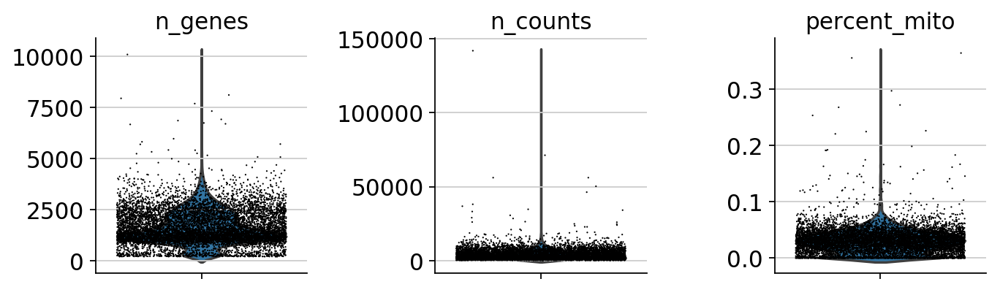

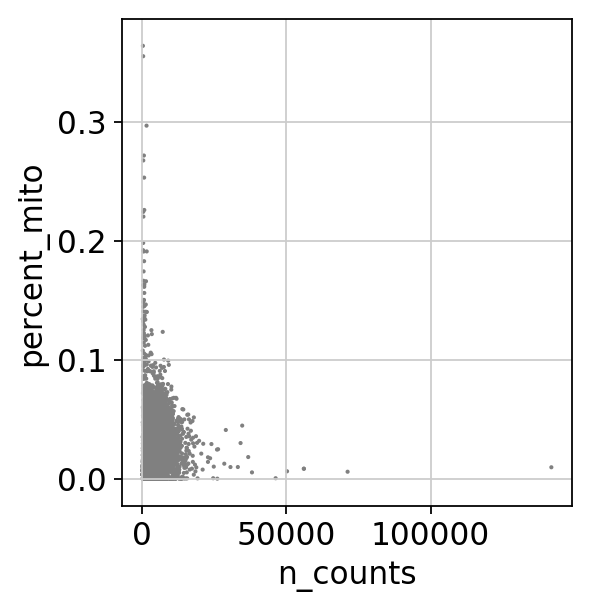

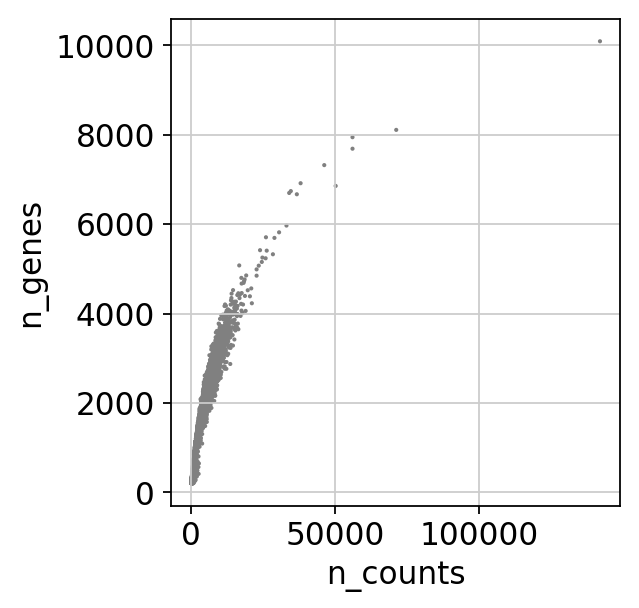

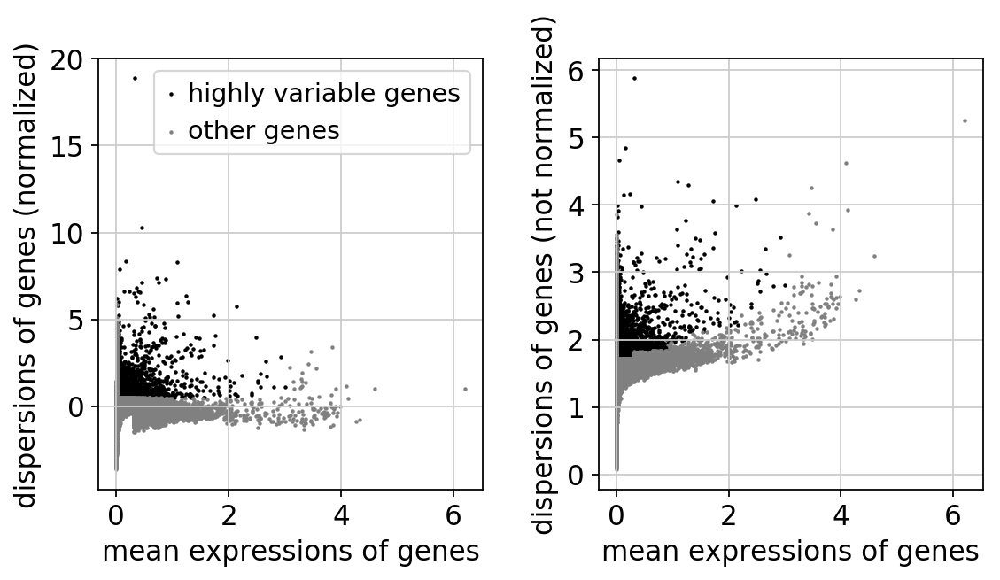

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:13.08)


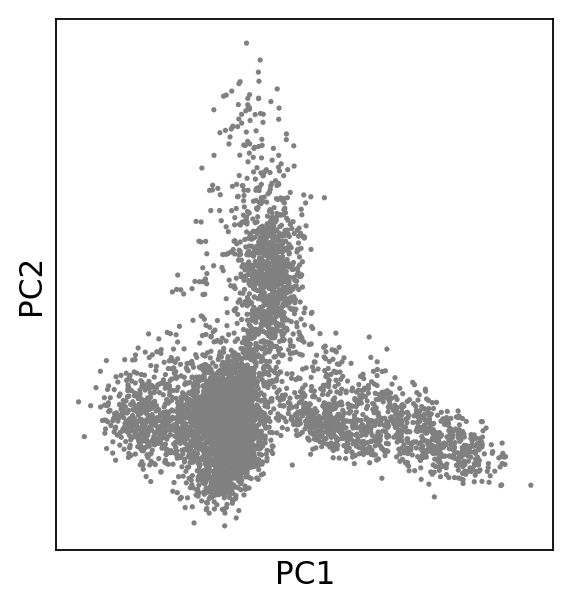

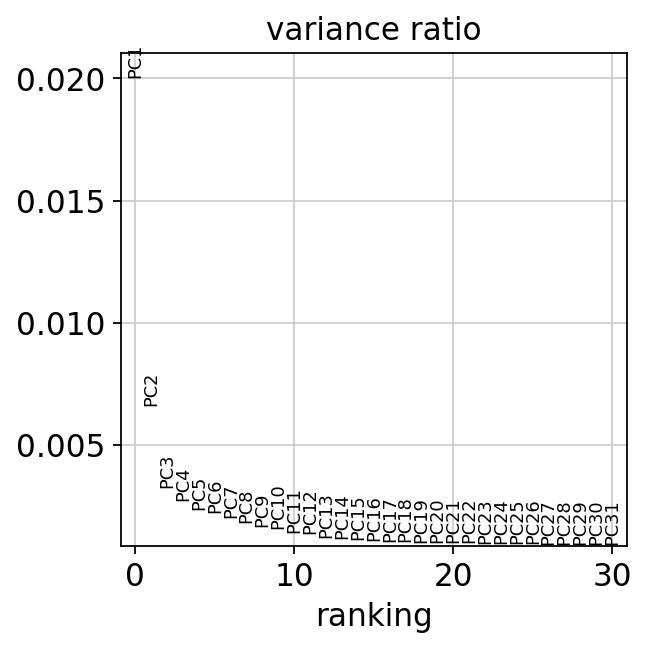

computing neighbors
    using 'X_pca' with n_pcs = 40


/global/apps/bioinf/conda_envs/public/scanpy/scanpy-1.3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


    finished (0:00:02.28) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:09.59) --> added
    'X_umap', UMAP coordinates (adata.obsm)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.31) --> found 20 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/umapPT_Clust_LV_Genes2500_Mito0_04_CTRL_3.svg


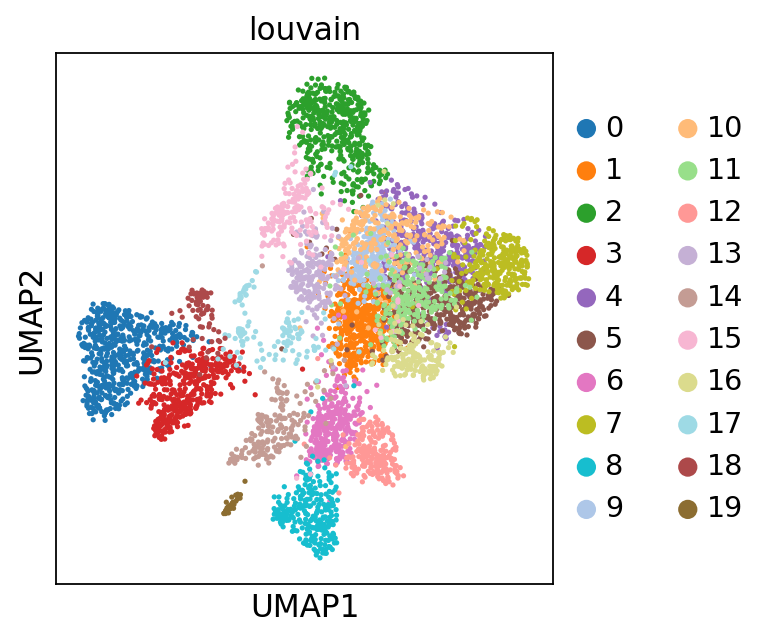

In [51]:
PreprocessSC(data_path = '/data/bioinf/projects/data/2018_scanpyTutorial/input/sc_hROHT/S3_CTRL_HRO2/raw_gene_bc_matrices/hg38.e87/',
             data_type = 'CTRL_3')
ParaTune_Clust(adata_input = adata, 
               cutoff_mito = 0.04, 
               cutoff_ngenes = 2500, 
               data_type = 'CTRL_3')
adata_C3 = adata

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_MG_CTRL_3_higherResolution.svg


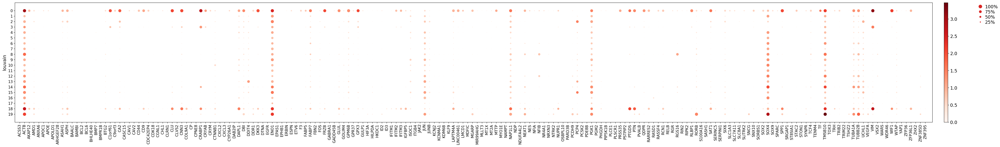

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_Progenitor_CTRL_3_higherResolution.svg


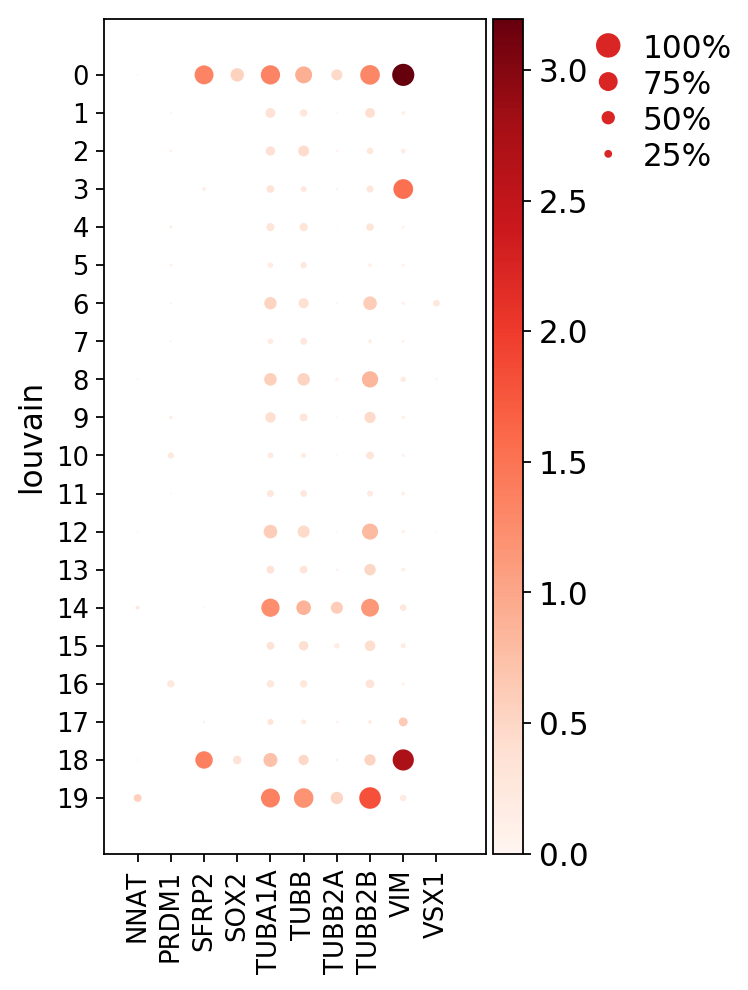

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_AC_CTRL_3_higherResolution.svg


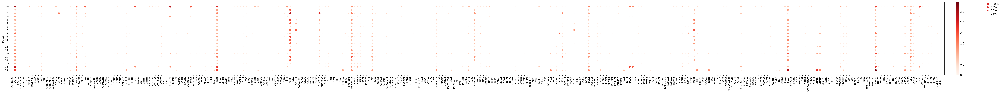

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_TC1_CTRL_3_higherResolution.svg


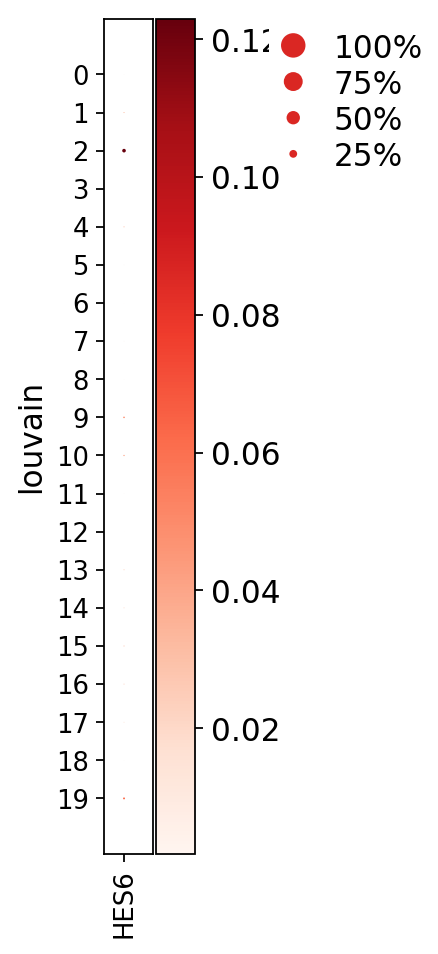

No overlap found for TC3
saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_HC_CTRL_3_higherResolution.svg


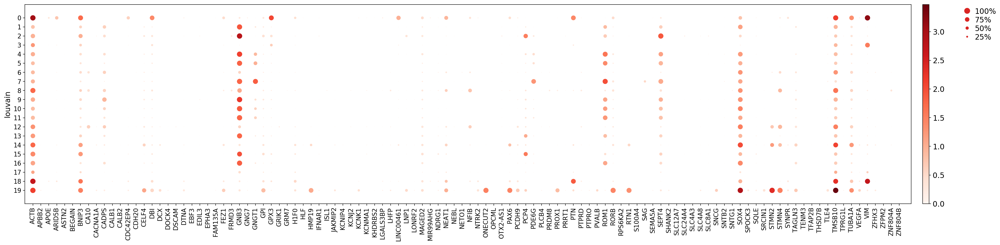

No overlap found for TC2
saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_Cone_CTRL_3_higherResolution.svg


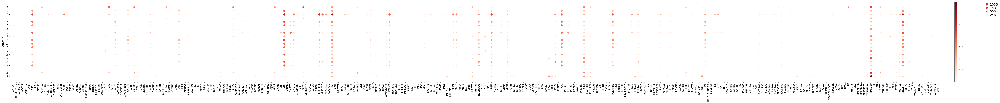

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_GC_CTRL_3_higherResolution.svg


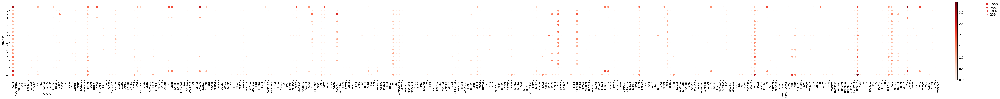

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_PR_CTRL_3_higherResolution.svg


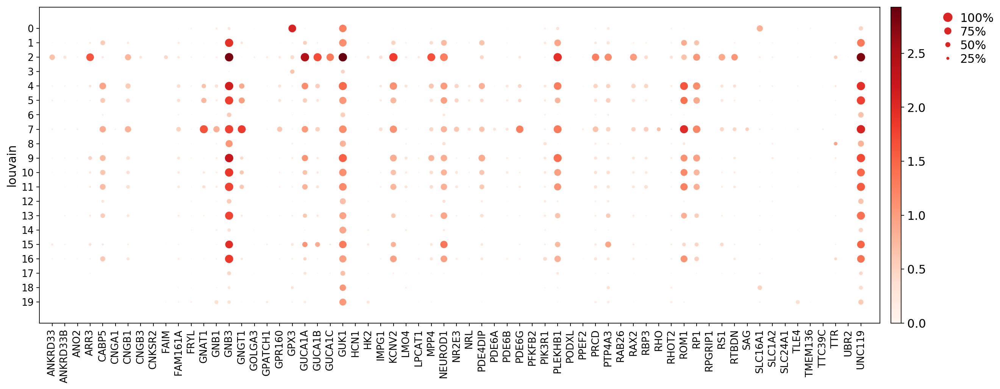

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_BP_CTRL_3_higherResolution.svg


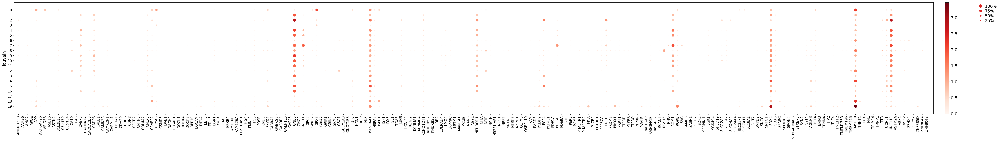

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_Rod_CTRL_3_higherResolution.svg


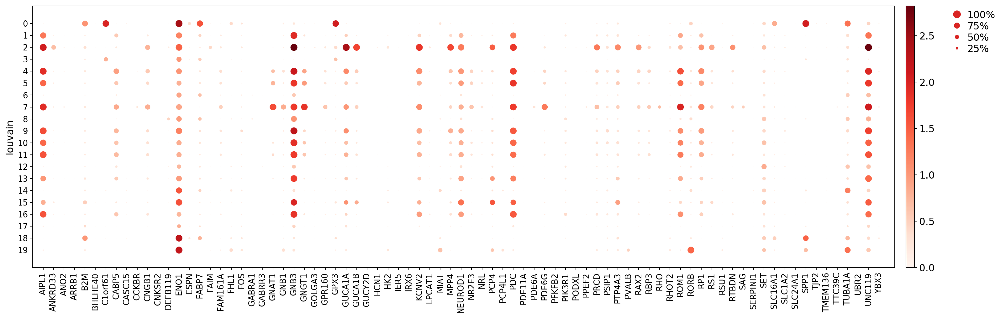

In [52]:
GOI_MK_dotplot(adata_input = adata, 
                data_type = 'CTRL_3_higherResolution')

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_Photoreceptors_Control3.svg


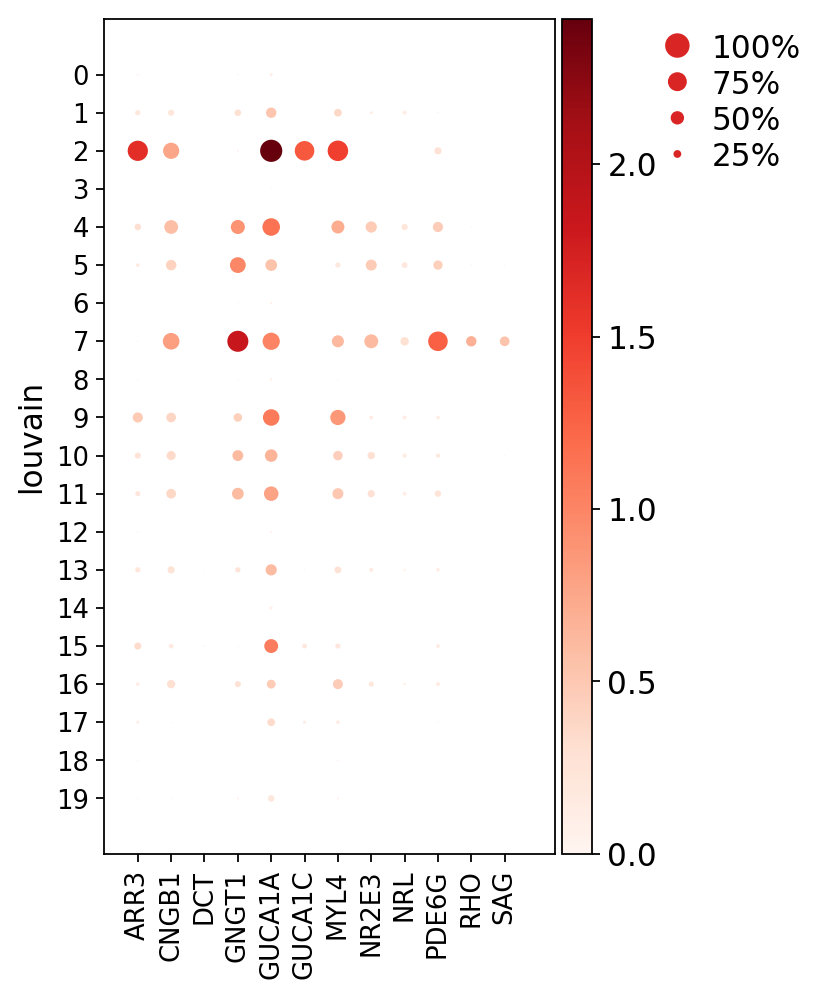

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MG_Control3.svg


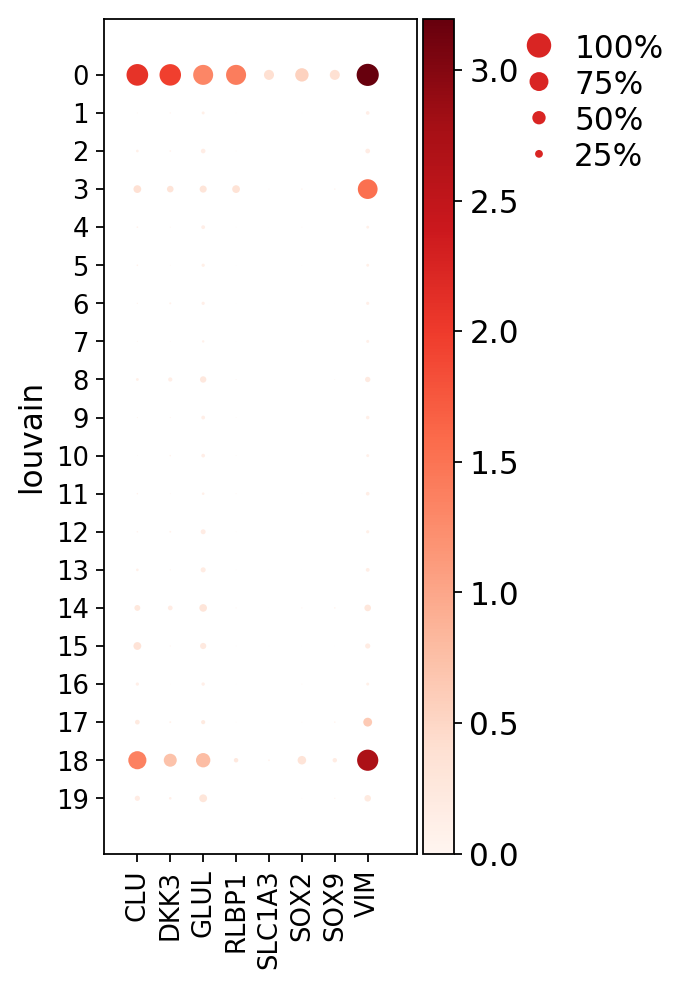

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_Bipolars_Control3.svg


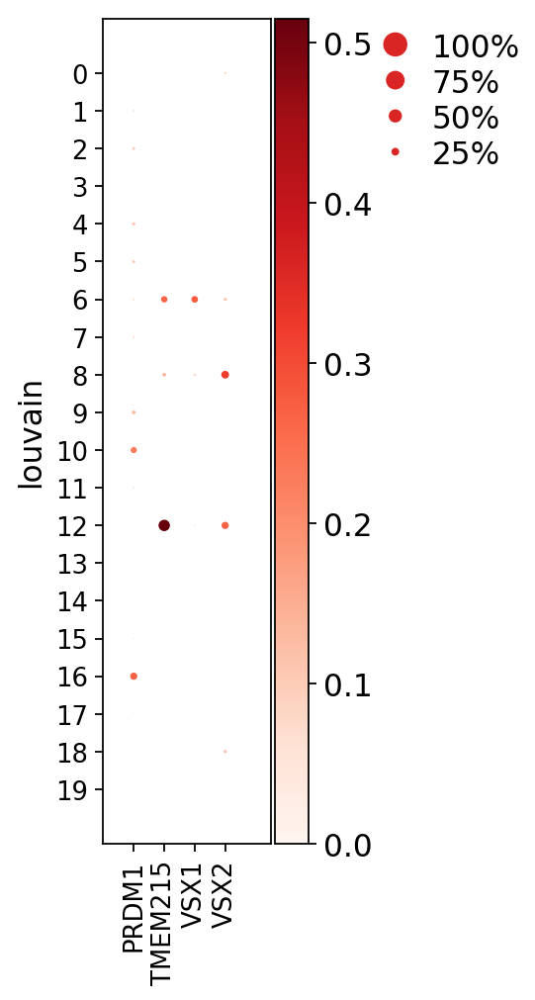

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_AHG_Control3.svg


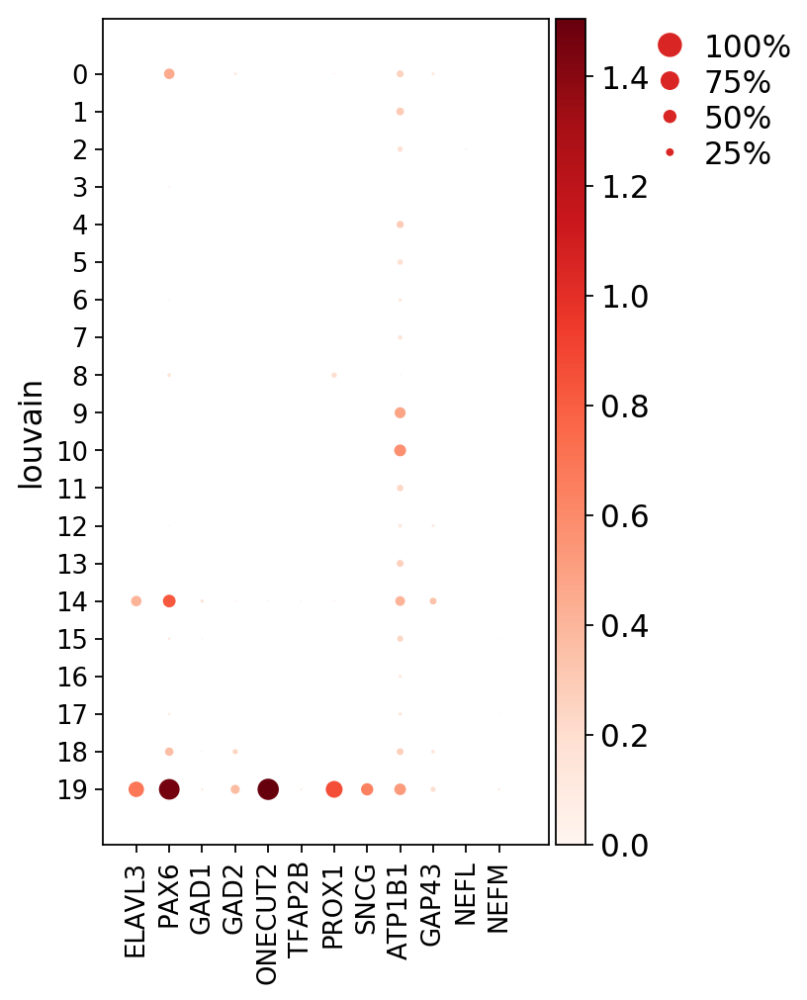

In [53]:
genes = ["CRX", "RCVRN", "NRL", "ARR3", "ARR1", "RHO", "OPN1SW", "OPN1MW",
                         "OPN1LW", "NR2E3", "MYL4", "PRPH2", "NUP93", "PDGR1", "TRAPPC2L", 
                         "SLC12A6", "CCDC136", "DCT", "SAG", "THRB", "PDE6H", "GUCA1C", 
                         "GNAT2", "GNGT1", "PDE6G", "CNGB1","GUCA1C", "GUCA1A"]
#subset = adata.var_names.isin(genes)
c = np.intersect1d(genes, adata.var_names)
sc.pl.dotplot(adata, c, groupby='louvain', save="_Photoreceptors_Control3.svg")

genes = ["RLBP1", "VIM", "GFAP", "SOX9", "SLC1A3", "SOX2", "CLU", "DKK3", "GLUL"]
#subset = adata.var_names.isin(genes)
c = np.intersect1d(genes, adata.var_names)
sc.pl.dotplot(adata, c, groupby='louvain', save="_MG_Control3.svg")

genes = ["VSX1", "VSX2", "OTX2", "PRKCA", 'PRDM1', "GRM6", "TMEM215", "BHLHB5", 'ISLET1']
#subset = adata.var_names.isin(genes)
c = np.intersect1d(genes, adata.var_names)
sc.pl.dotplot(adata, c, groupby='louvain', save="_Bipolars_Control3.svg")

genes = ["ELAVL3", "PAX6", "GAD1", "GAD2", "ONECUT2", "TFAP2B", "PROX1", "SNCG",'ATP1B1',"GAP43", "NEFL", 'NEFM' ]
#subset = adata.var_names.isin(genes)
#c = np.intersect1d(genes, adata.var_names)
sc.pl.dotplot(adata, genes, groupby='louvain', save="_AHG_Control3.svg")

... storing 'Celltype' as categorical


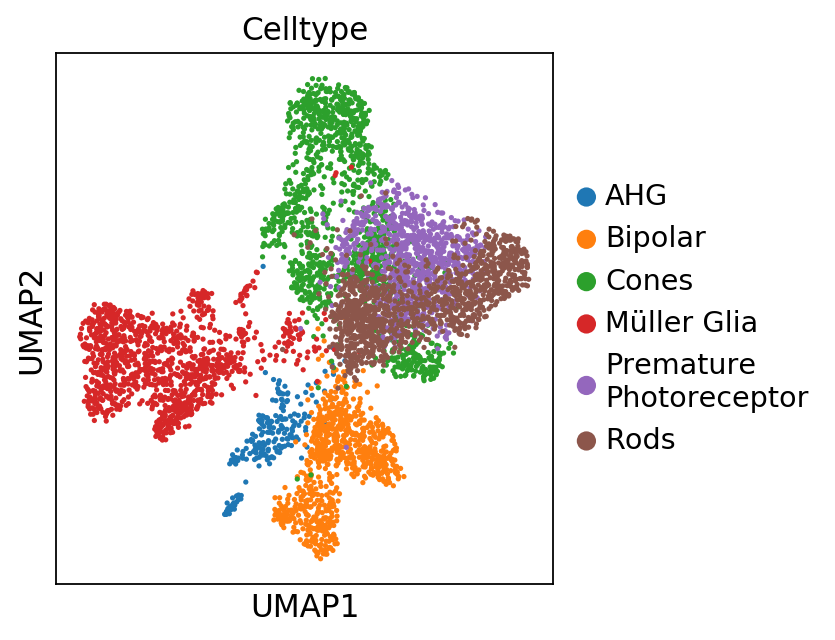

In [54]:
conditions = [
    (adata.obs['louvain'] == "2") | (adata.obs['louvain'] == '9') | (adata.obs['louvain'] == "13") | (adata.obs['louvain'] == "15") | (adata.obs['louvain'] == "16"),
    (adata.obs['louvain'] == "1") | (adata.obs['louvain'] == "5") | (adata.obs['louvain'] == '7'),
    (adata.obs['louvain'] == "0") | (adata.obs['louvain'] == "3") | (adata.obs['louvain'] == "17") | (adata.obs['louvain'] == "18") ,
    (adata.obs['louvain'] == "6") | (adata.obs['louvain'] == "8") | (adata.obs['louvain'] == "12"),
    (adata.obs['louvain'] == "14") | (adata.obs['louvain'] == "19"),
    (adata.obs['louvain'] == "4") |(adata.obs['louvain'] == '10') |(adata.obs['louvain'] == "11")
    ]

# create a list of the values we want to assign for each condition
values = ['Cones', 'Rods', 'Müller Glia', 'Bipolar', "AHG", "Premature\nPhotoreceptor"]

# create a new column and use np.select to assign values to it using our lists as arguments
adata.obs['Celltype'] = np.select(conditions, values)
sc.pl.umap(adata, color=['Celltype'])

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/umap_ClusterAnnot_Control3.svg


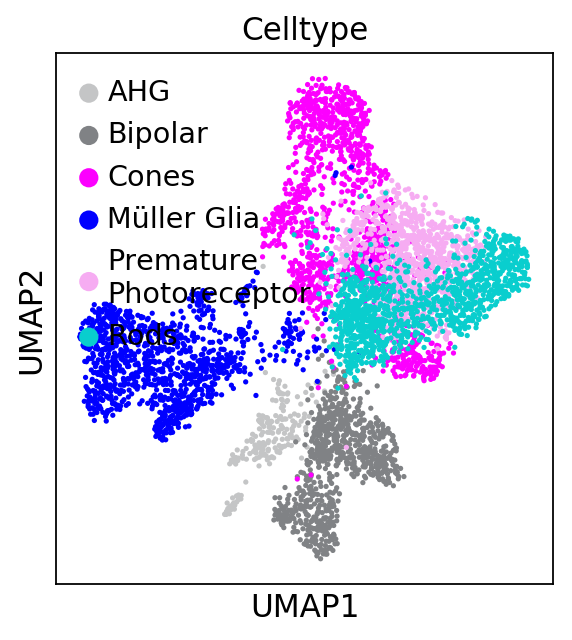

/global/apps/bioinf/conda_envs/public/scanpy/scanpy-1.3/lib/python3.6/site-packages/anndata/readwrite/write.py:301: UserWarning: Could not save field with key = "uns/Celltype_categories" to hdf5 file.
  'to hdf5 file.'.format(key))


In [55]:
#AHG, Bipolar, Cones, Mueller Glia, Photoreceptor, Rods

adata.uns['Celltype_colors'][0] = ahg_col
adata.uns['Celltype_colors'][1] = bi_col
adata.uns['Celltype_colors'][2] = cones_col
adata.uns['Celltype_colors'][3] = MuGl_col
adata.uns['Celltype_colors'][4] = pr_col
adata.uns['Celltype_colors'][5] = rods_col


sc.pl.umap(adata, color=['Celltype'],legend_loc='upper left', save = "_ClusterAnnot_Control3.svg")
adata.write('/data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/Data/Control3_pp.h5ad')
#adata.write('/work/steinheu/20210731_Control3.h5ad')

In [56]:
adata.obs["Celltype"].to_csv("/data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/csvs/Chapter9_Manual_Annot_HRO3.csv")

In [57]:
## Control 2

... reading from cache file ./cache/data-bioinf-projects-data-2018_scanpyTutorial-input-sc_hROHT-S2_CTRL_HRO1-outs-raw_gene_bc_matrices-hg38.e87-matrix.h5ad
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
filtered out 332278 cells that have less than 1 counts


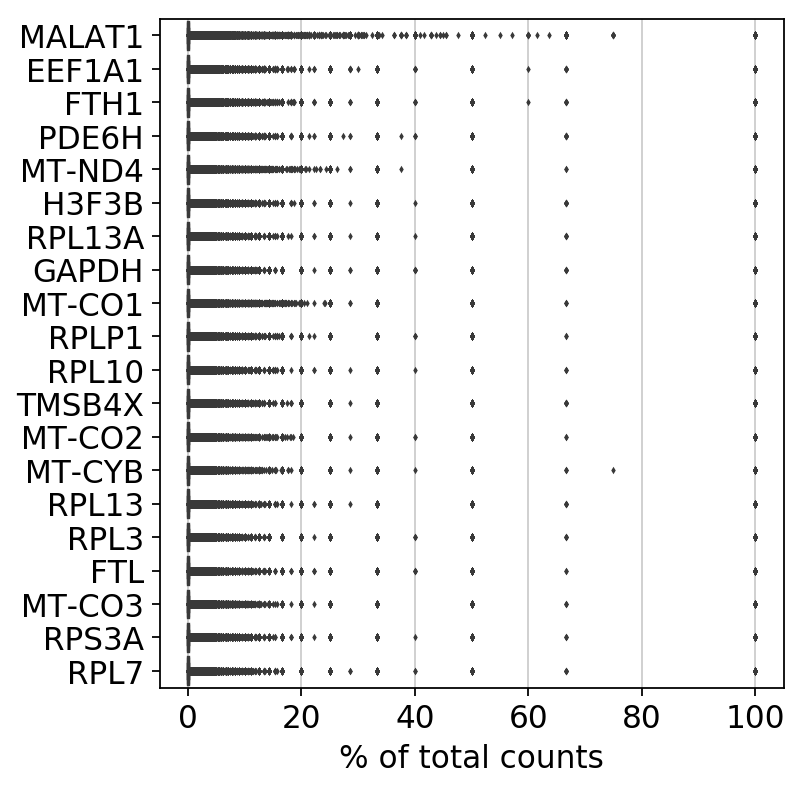

filtered out 727761 cells that have less than 200 genes expressed
filtered out 11292 genes that are detected in less than 3 cells
saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/violinPT_Clust_Violin_Genes_Counts_Mito_CTRL_2.svg


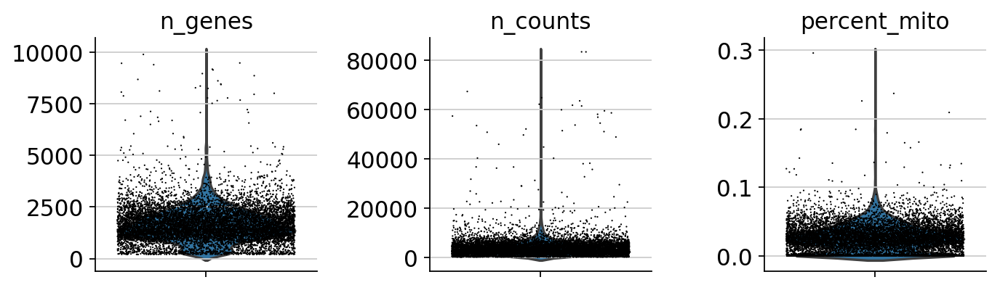

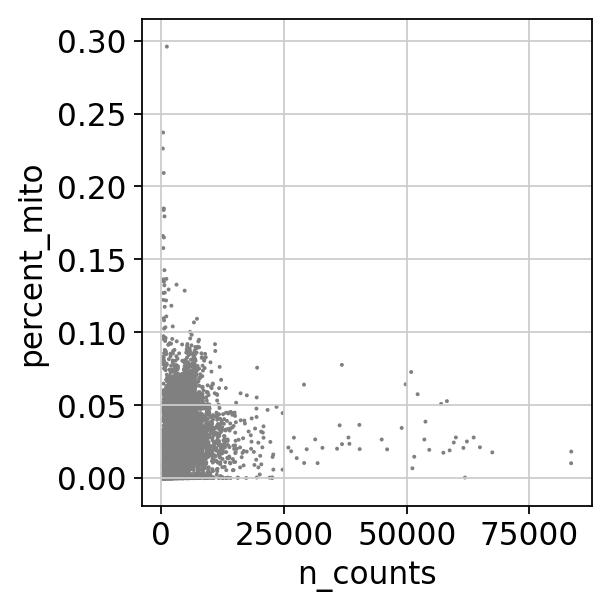

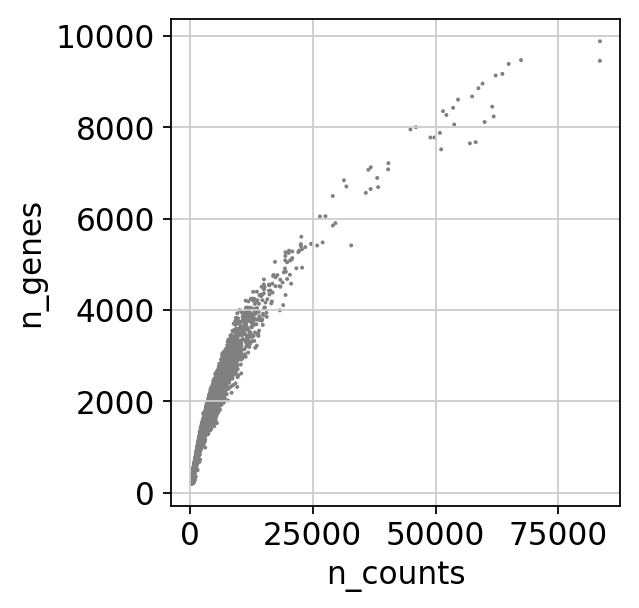

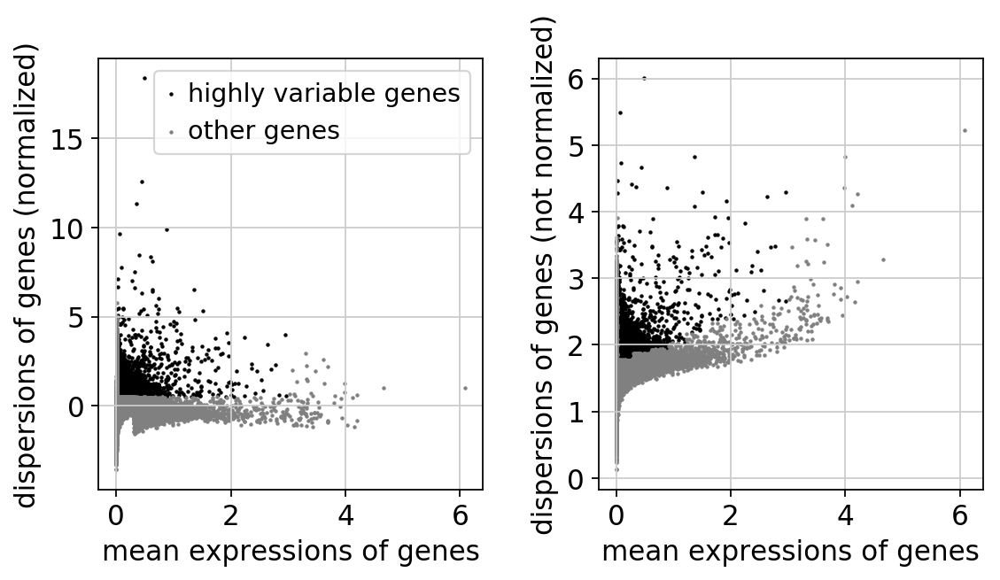

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:00:15.62)


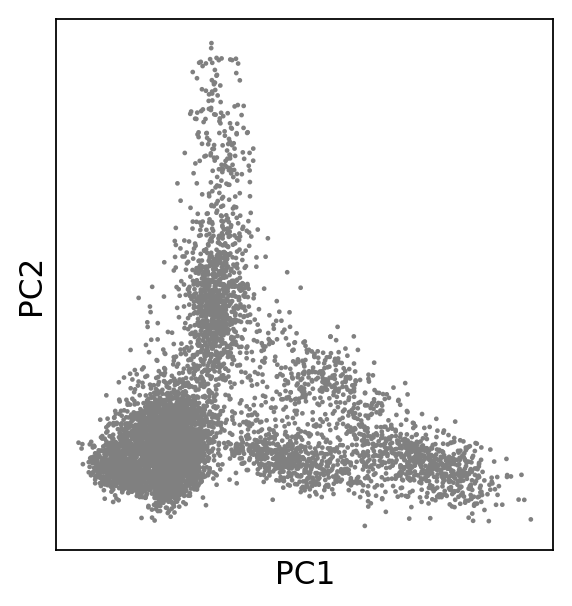

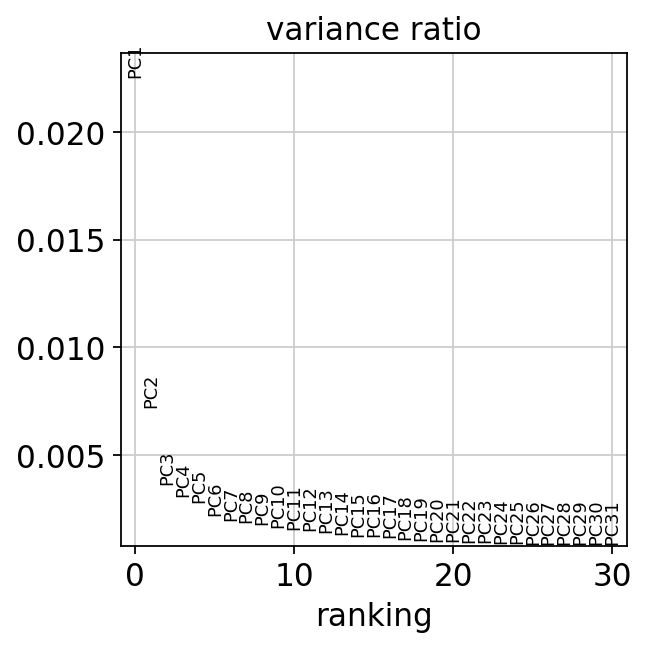

computing neighbors
    using 'X_pca' with n_pcs = 40


/global/apps/bioinf/conda_envs/public/scanpy/scanpy-1.3/lib/python3.6/site-packages/sklearn/metrics/pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


    finished (0:00:02.96) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:11.81) --> added
    'X_umap', UMAP coordinates (adata.obsm)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:00.36) --> found 22 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)
saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/umapPT_Clust_LV_Genes2500_Mito0_04_CTRL_2.svg


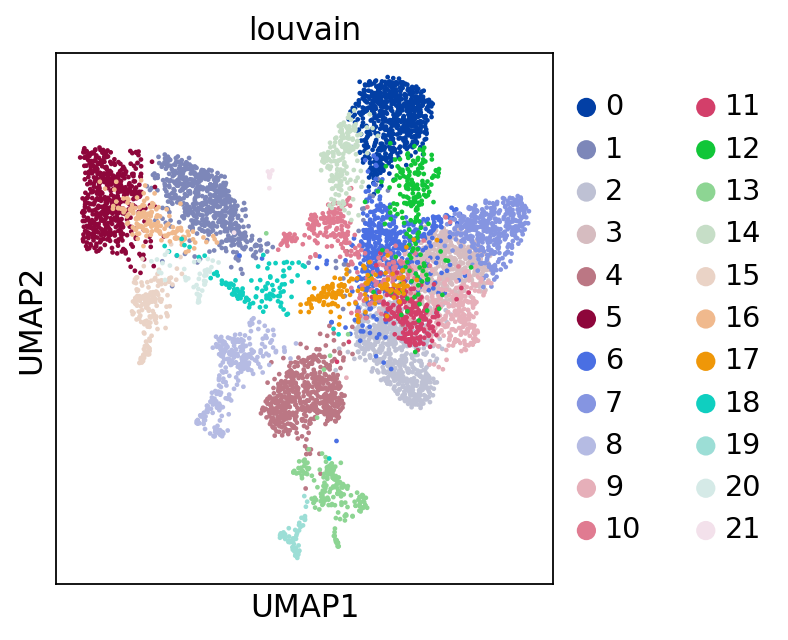

In [58]:
PreprocessSC(data_path = '/data/bioinf/projects/data/2018_scanpyTutorial/input/sc_hROHT/S2_CTRL_HRO1/outs/raw_gene_bc_matrices/hg38.e87/',
             data_type = 'CTRL_2')
ParaTune_Clust(adata_input = adata, 
               cutoff_mito = 0.04, 
               cutoff_ngenes = 2500, 
               data_type = 'CTRL_2')
adata_C2 = adata

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_MG_CTRL_2_higherResolution.svg


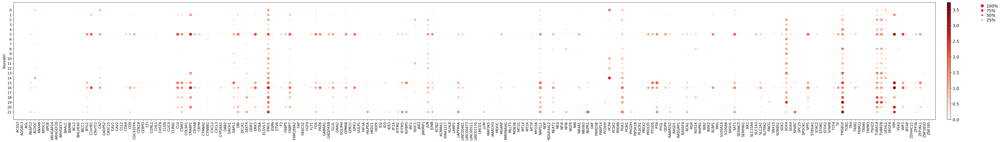

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_Progenitor_CTRL_2_higherResolution.svg


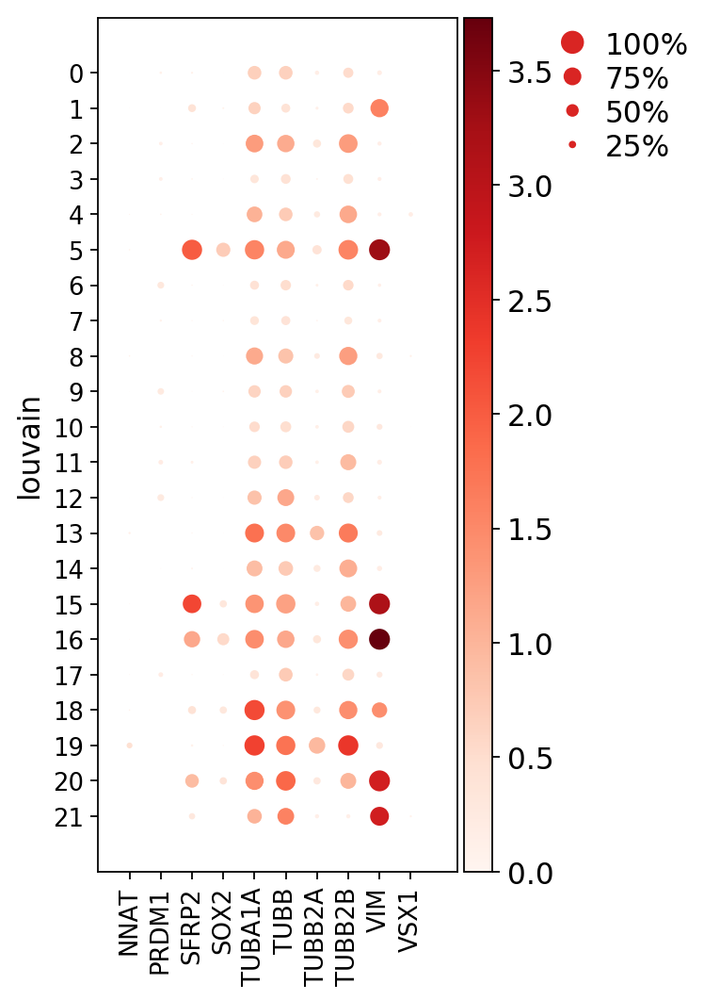

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_AC_CTRL_2_higherResolution.svg


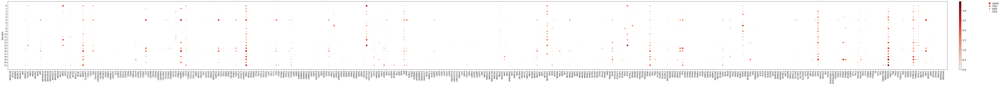

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_TC1_CTRL_2_higherResolution.svg


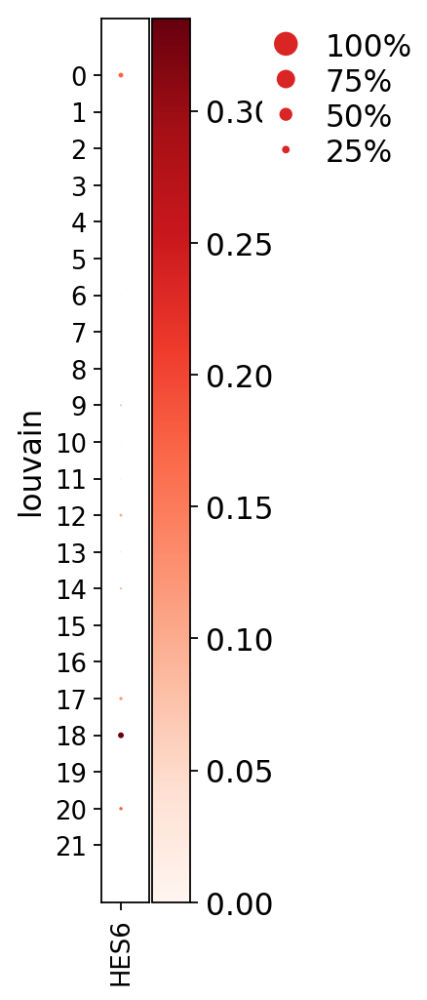

No overlap found for TC3
saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_HC_CTRL_2_higherResolution.svg


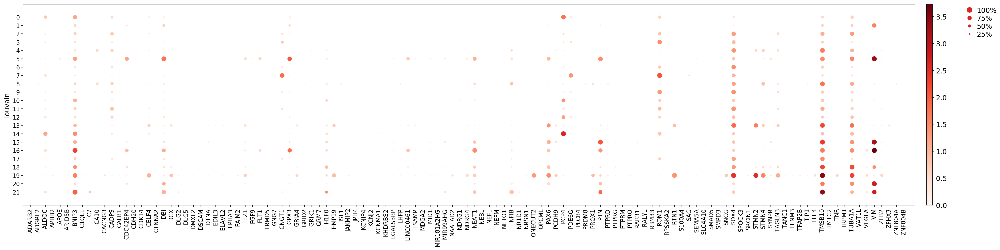

No overlap found for TC2
saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_Cone_CTRL_2_higherResolution.svg


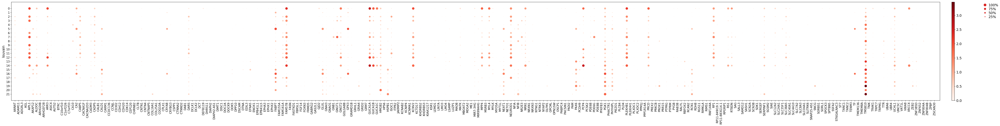

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_GC_CTRL_2_higherResolution.svg


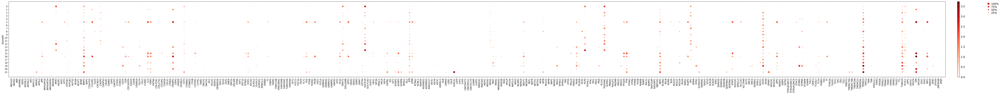

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_PR_CTRL_2_higherResolution.svg


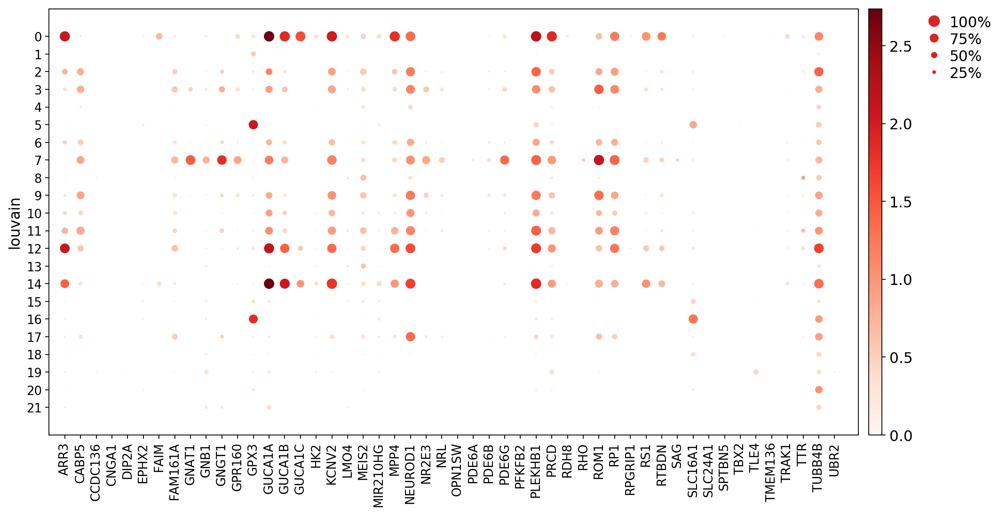

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_BP_CTRL_2_higherResolution.svg


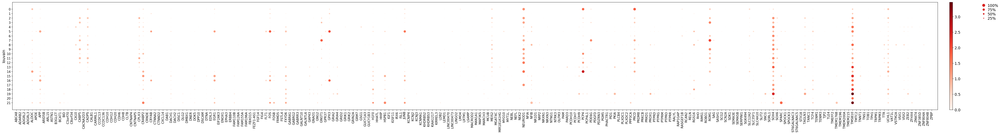

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MasterGOI_Rod_CTRL_2_higherResolution.svg


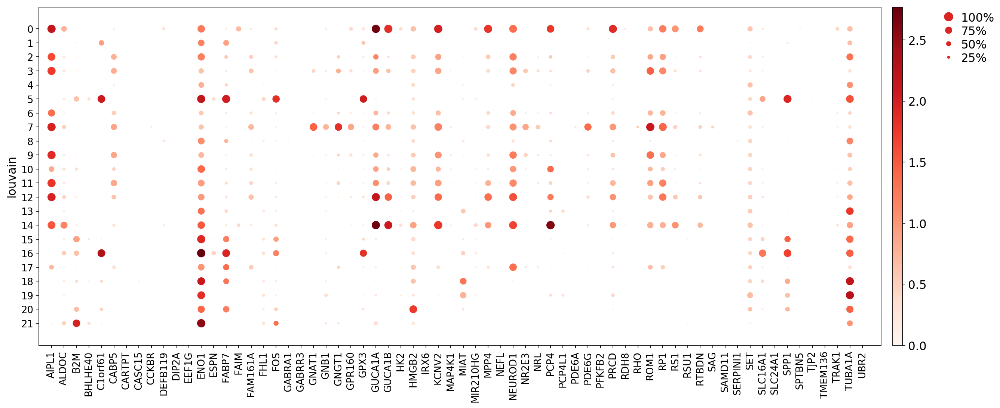

In [59]:
GOI_MK_dotplot(adata_input = adata, 
                data_type = 'CTRL_2_higherResolution')

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_Photoreceptors_Control2.svg


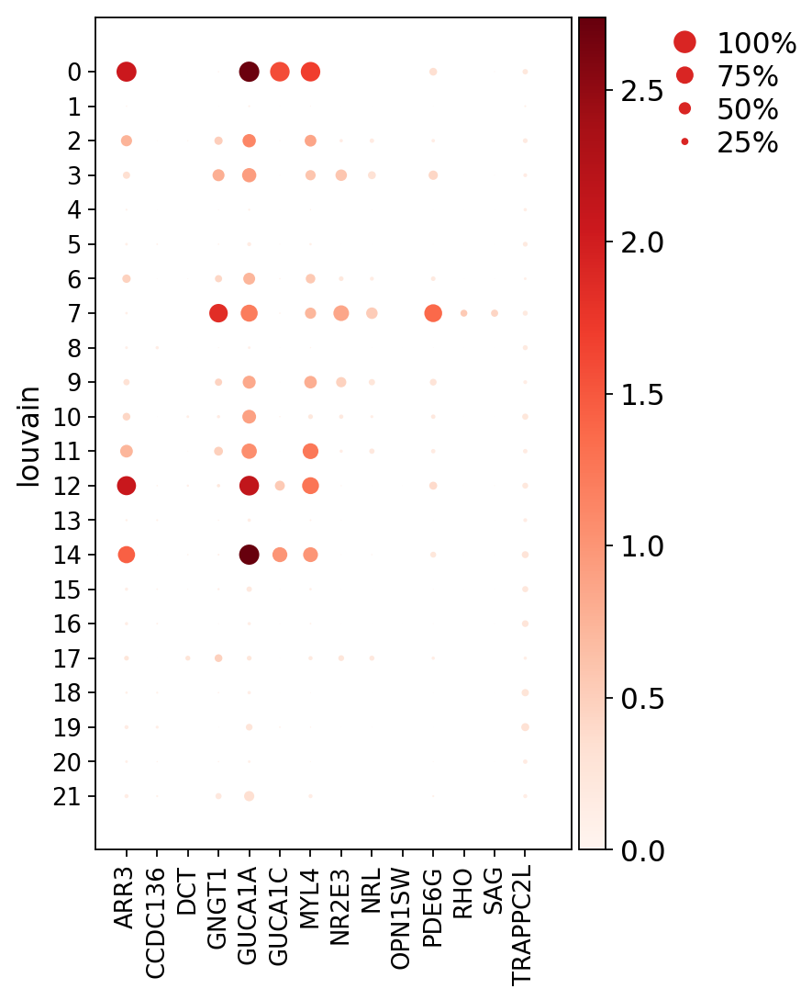

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_MG_Control2.svg


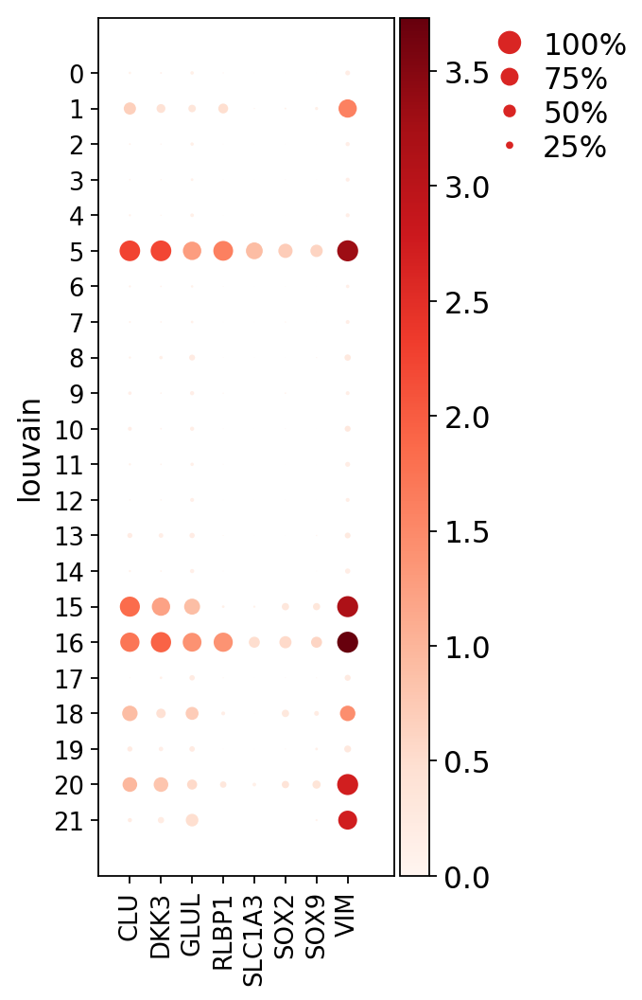

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_Bipolars_Control2.svg


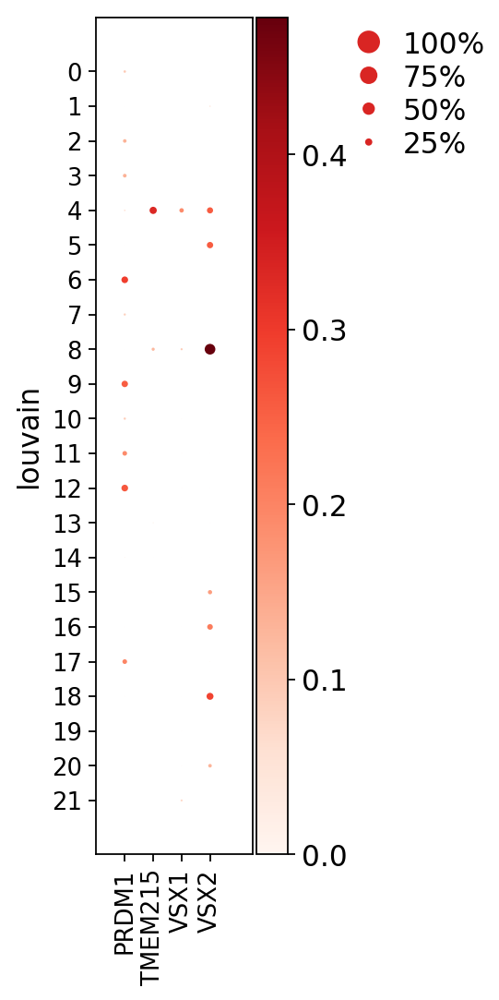

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/dotplot_AHG_Control2.svg


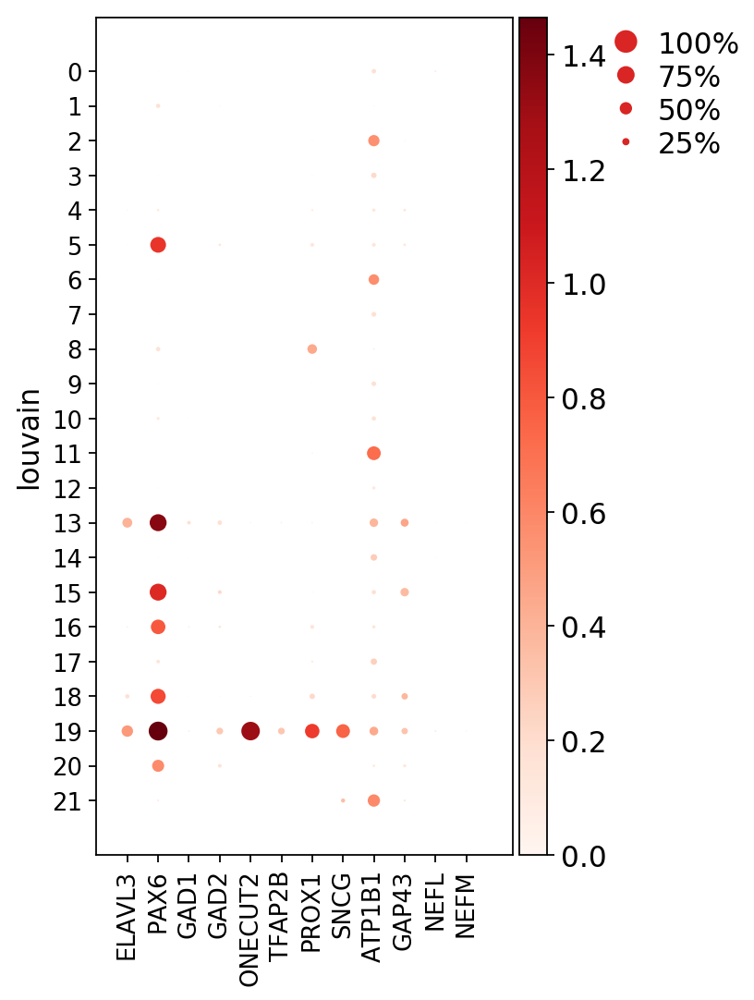

In [60]:
genes = ["CRX", "RCVRN", "NRL", "ARR3", "ARR1", "RHO", "OPN1SW", "OPN1MW",
                         "OPN1LW", "NR2E3", "MYL4", "PRPH2", "NUP93", "PDGR1", "TRAPPC2L", 
                         "SLC12A6", "CCDC136", "DCT", "SAG", "THRB", "PDE6H", "GUCA1C", 
                         "GNAT2", "GNGT1", "PDE6G", "CNGB1","GUCA1C", "GUCA1A"]
#subset = adata.var_names.isin(genes)
c = np.intersect1d(genes, adata.var_names)
sc.pl.dotplot(adata, c, groupby='louvain', save="_Photoreceptors_Control2.svg")

genes = ["RLBP1", "VIM", "GFAP", "SOX9", "SLC1A3", "SOX2", "CLU", "DKK3", "GLUL"]
#subset = adata.var_names.isin(genes)
c = np.intersect1d(genes, adata.var_names)
sc.pl.dotplot(adata, c, groupby='louvain', save="_MG_Control2.svg")

genes = ["VSX1", "VSX2", "OTX2", "PRKCA", 'PRDM1', "GRM6", "TMEM215", "BHLHB5", 'ISLET1']
#subset = adata.var_names.isin(genes)
c = np.intersect1d(genes, adata.var_names)
sc.pl.dotplot(adata, c, groupby='louvain', save="_Bipolars_Control2.svg")

genes = ["ELAVL3", "PAX6", "GAD1", "GAD2", "ONECUT2", "TFAP2B", "PROX1", "SNCG",'ATP1B1',"GAP43", "NEFL", 'NEFM' ]
#subset = adata.var_names.isin(genes)
#c = np.intersect1d(genes, adata.var_names)
sc.pl.dotplot(adata, genes, groupby='louvain', save="_AHG_Control2.svg")

... storing 'Celltype' as categorical


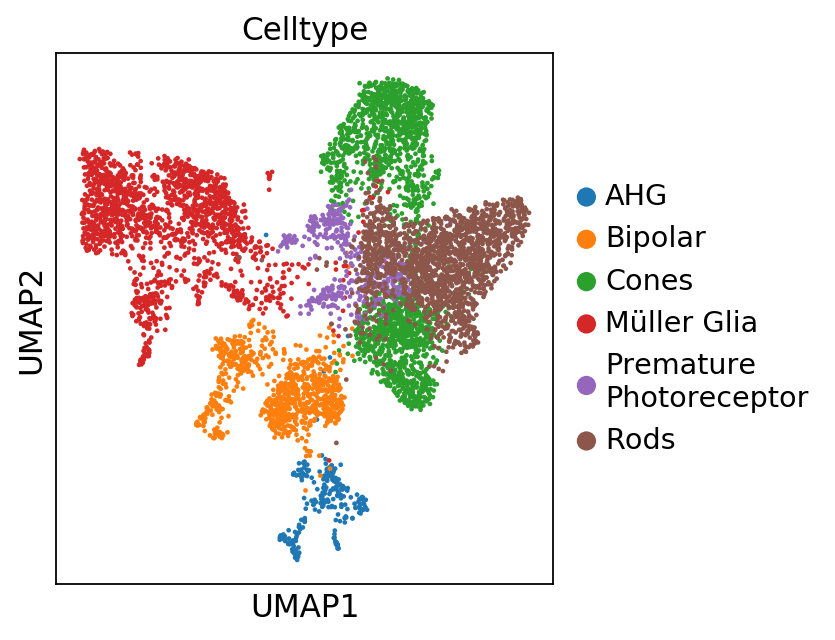

saving figure to file /data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/results/umap_ClusterAnnot_Control2.svg


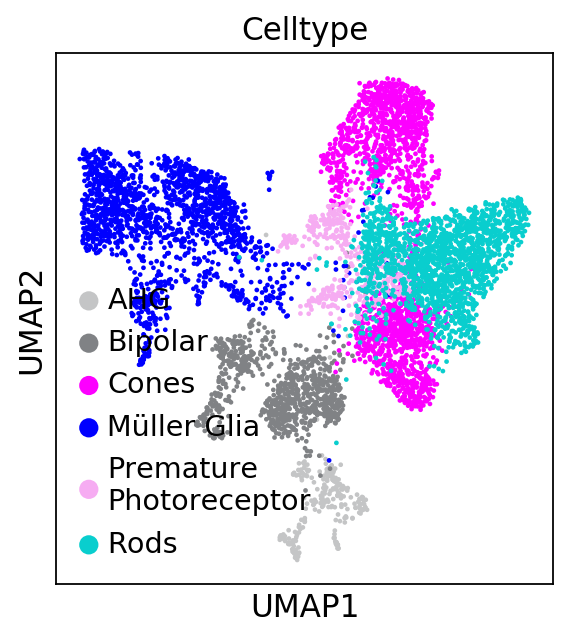

/global/apps/bioinf/conda_envs/public/scanpy/scanpy-1.3/lib/python3.6/site-packages/anndata/readwrite/write.py:301: UserWarning: Could not save field with key = "uns/Celltype_categories" to hdf5 file.
  'to hdf5 file.'.format(key))


In [61]:
conditions = [
    (adata.obs['louvain'] == "0") | (adata.obs['louvain'] == '2') | (adata.obs['louvain'] == "11") | (adata.obs['louvain'] == "12") | (adata.obs['louvain'] == "14"),
    (adata.obs['louvain'] == "3") | (adata.obs['louvain'] == "6") | (adata.obs['louvain'] == '7') | (adata.obs['louvain'] == '9'),
    (adata.obs['louvain'] == "1") | (adata.obs['louvain'] == "5") | (adata.obs['louvain'] == "15") | (adata.obs['louvain'] == "16") | (adata.obs['louvain'] == "18") | (adata.obs['louvain'] == "20") | (adata.obs['louvain'] == "21") ,
    (adata.obs['louvain'] == "4") | (adata.obs['louvain'] == "8"),
    (adata.obs['louvain'] == "13") | (adata.obs['louvain'] == "19"),
    (adata.obs['louvain'] == "10") |(adata.obs['louvain'] == '17')
    ]

# create a list of the values we want to assign for each condition
values = ['Cones', 'Rods', 'Müller Glia', 'Bipolar', "AHG", "Premature\nPhotoreceptor"]

# create a new column and use np.select to assign values to it using our lists as arguments
adata.obs['Celltype'] = np.select(conditions, values)
sc.pl.umap(adata, color=['Celltype'])
#AHG, Bipolar, Cones, Mueller Glia, Photoreceptor, Rods

adata.uns['Celltype_colors'][0] = ahg_col
adata.uns['Celltype_colors'][1] = bi_col
adata.uns['Celltype_colors'][2] = cones_col
adata.uns['Celltype_colors'][3] = MuGl_col
adata.uns['Celltype_colors'][4] = pr_col
adata.uns['Celltype_colors'][5] = rods_col


sc.pl.umap(adata, color=['Celltype'],legend_loc='lower left', save = "_ClusterAnnot_Control2.svg")
adata.write('/data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/Data/Control2_pp.h5ad')


In [62]:
adata.obs["Celltype"].to_csv("/data/bioinf/projects/data/2019_schROHT/2021_ManualAnnot/csvs/Chapter9_Manual_Annot_HRO2.csv")